In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.stats import median_abs_deviation
from scipy.stats import pearsonr


sc.settings.verbosity = 2
sc.logging.print_header()

scanpy==1.10.4 anndata==0.11.4 umap==0.5.7 numpy==1.26.4 scipy==1.15.2 pandas==2.2.3 scikit-learn==1.6.1 statsmodels==0.14.4 igraph==0.11.6 pynndescent==0.5.13


# Load in raw data

In [2]:
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/raw_merged_gene_data.h5ad"

adata_raw = sc.read_h5ad(path)
print(f"Initial shape: {adata_raw.shape}\n")
print(f"N cells in HYB dataset: {adata_raw[adata_raw.obs['dataset'] == 'Hybrid'].n_obs}")
print(f"N cells in scFib dataset: {adata_raw[adata_raw.obs['dataset'] == 'Control'].n_obs}\n")

adata_raw

Initial shape: (19858, 28702)

N cells in HYB dataset: 10895
N cells in scFib dataset: 8963



AnnData object with n_obs × n_vars = 19858 × 28702
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End'

In [3]:
### --- Handle HYB cells with NaN feature barcode predictions ---
init_cells_hybrid = adata_raw[adata_raw.obs['dataset'] == 'Hybrid'].n_obs

# remove HYB cells with NaN feature barcode predictions
hybrid_to_remove = (adata_raw.obs['dataset'] == 'Hybrid') & (adata_raw.obs['assigned_condition'].isna())
cells_to_keep = ~(hybrid_to_remove)
adata_raw = adata_raw[cells_to_keep].copy()

final_cells_hybrid = adata_raw[adata_raw.obs['dataset'] == 'Hybrid'].n_obs
removed_hybrid_cells = init_cells_hybrid - final_cells_hybrid

print(f"Removed {removed_hybrid_cells} 'Hybrid' cells with unassigned feature barcodes")
print(f"Final shape: {adata_raw.shape}")


### --- Add new column for grouping HYB cells vs Controls ---
adata_raw.obs['pooled_condition'] = adata_raw.obs['assigned_condition'].replace({
    "G1": "Control",
    "S": "Control",
    "G2M": "Control",
    "PRRX1": "siPRRX1",
    "PRRX1_MYOD": "siPRRX1/mmMYOD1",
    "MYOD": "mmMYOD1"
})

# fill remaining NaN feature barcode predictions (only control cells) with 'Control'
adata_raw.obs['pooled_condition'] = adata_raw.obs['pooled_condition'].fillna('Control')
print(adata_raw.obs['pooled_condition'].value_counts())

adata_raw

Removed 1 'Hybrid' cells with unassigned feature barcodes
Final shape: (19857, 28702)
pooled_condition
Control            8963
siPRRX1/mmMYOD1    4174
siPRRX1            3955
mmMYOD1            2765
Name: count, dtype: int64


/tmp/ipykernel_3499217/1807916870.py:17: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_raw.obs['pooled_condition'] = adata_raw.obs['assigned_condition'].replace({


AnnData object with n_obs × n_vars = 19857 × 28702
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End'

(19857, 3)


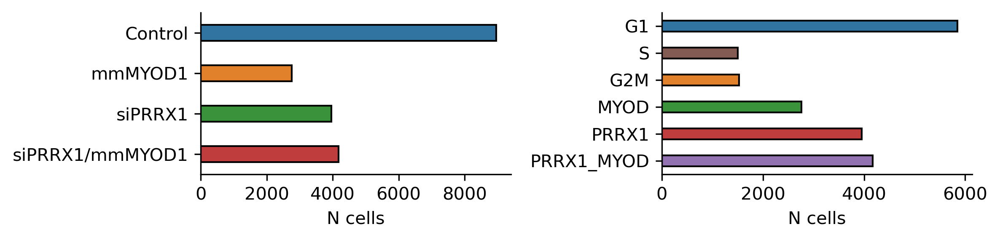

In [45]:
counts = pd.DataFrame({
    'cell_id': adata_raw.obs.index,
    'pooled_condition': adata_raw.obs['pooled_condition'].values,
    'assigned_condition': adata_raw.obs['assigned_condition'].values,
})

print(counts.shape)

pool_df = counts.groupby('pooled_condition', observed=True).size().reset_index(name='cell_count')

barcode_df = counts.groupby('assigned_condition', observed=True).size().reset_index(name='cell_count')


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 2
fig, axs = plt.subplots(1, 2)

sns.barplot(data=pool_df, x='cell_count', y='pooled_condition', hue='pooled_condition', width=0.4, ec='k', ax=axs[0])
    
sns.barplot(data=barcode_df, x='cell_count', y='assigned_condition', hue='assigned_condition', width=0.4, ec='k', ax=axs[1],
           order=['G1', 'S', 'G2M', 'MYOD', 'PRRX1', 'PRRX1_MYOD'])

axs[0].set_ylabel("")
axs[1].set_ylabel("")
axs[0].set_xlabel("N cells")
axs[1].set_xlabel("N cells")

sns.despine()
plt.tight_layout()
plt.show()

# QC

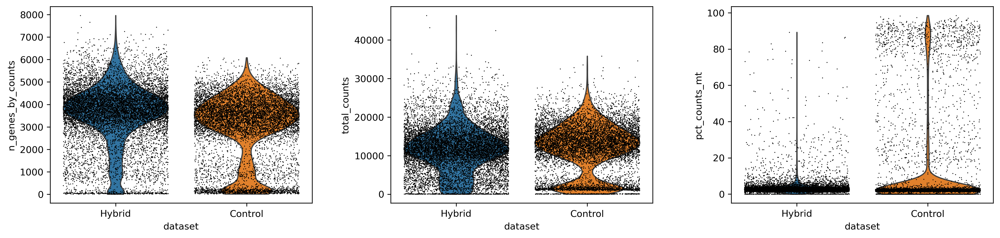

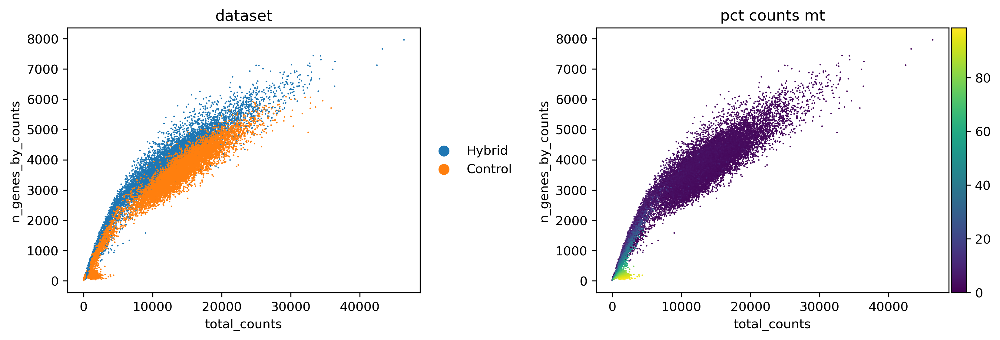

In [4]:
# mitochondrial genes
adata_raw.var["mt"] = adata_raw.var_names.str.startswith("MT-")
# ribosomal genes
adata_raw.var["ribo"] = adata_raw.var_names.str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(adata_raw, qc_vars=["mt", "ribo"], inplace=True, log1p=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

sc.pl.violin(
    adata_raw,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
    groupby='dataset',
)

sc.pl.scatter(adata_raw, "total_counts", "n_genes_by_counts", color=["dataset", "pct_counts_mt"])

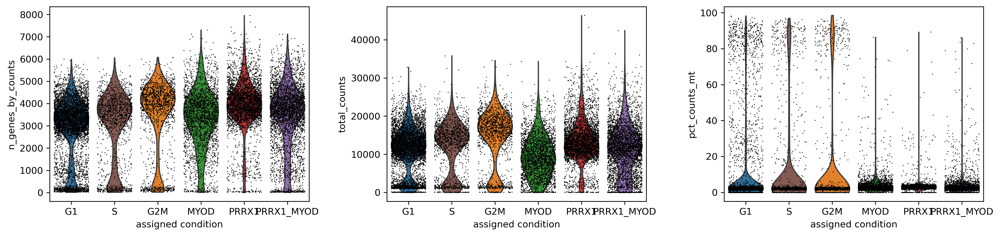

In [5]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

sc.pl.violin(
    adata_raw,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
    groupby='assigned_condition',
    order=['G1', 'S', 'G2M', 'MYOD', 'PRRX1', 'PRRX1_MYOD'],
    legend=False,
)

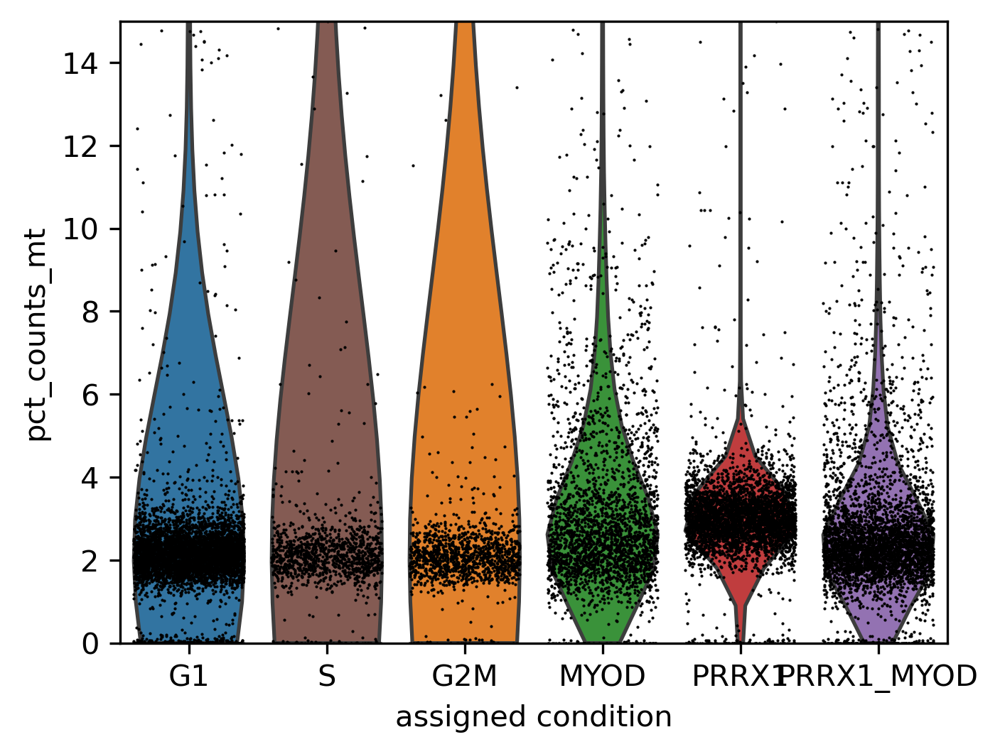

In [6]:
sc.pl.violin(
    adata_raw,
    ["pct_counts_mt"],
    jitter=0.4,
    groupby='assigned_condition',
    order=['G1', 'S', 'G2M', 'MYOD', 'PRRX1', 'PRRX1_MYOD'],
    legend=False,
    show=False,
)

plt.ylim(0, 15) 
plt.show()

In [8]:
adata_raw.obs.groupby('assigned_condition', observed=True)['pct_counts_mt'].agg(['mean', 'median'])

,mean,median
assigned_condition,,
G1,9.876417,2.203367
G2M,13.439607,2.160579
MYOD,4.083251,2.625379
PRRX1,3.354420,2.993963
PRRX1_MYOD,3.459837,2.347016
S,13.590803,2.211606


# MAD filtering: Identify outlier (low quality) cells

In [61]:
# Identify outlier cells with MADs per dataset
def is_outlier_by_group(adata, metric: str, nmads: int, group_col: str = 'dataset'):
    outlier_series = pd.Series(False, index=adata.obs.index)
    unique_groups = adata.obs[group_col].unique()

    for group in unique_groups:
        group_mask = (adata.obs[group_col] == group)
        M_group = adata.obs.loc[group_mask, metric]

        if len(M_group) < 2 or M_group.isnull().all():
            continue

        median_val_group = np.median(M_group)
        mad_val_group = median_abs_deviation(M_group)

        if mad_val_group == 0:
            continue

        outliers_in_group = (M_group < median_val_group - nmads * mad_val_group) | \
                            (median_val_group + nmads * mad_val_group < M_group)

        outlier_series.loc[group_mask] = outliers_in_group

    return outlier_series



adata = adata_raw.copy()


adata.obs["outlier"] = (
    is_outlier_by_group(adata, "log1p_total_counts", 5, 'dataset')
    | is_outlier_by_group(adata, "log1p_n_genes_by_counts", 5, 'dataset')
)

print("Number of outlier cells per dataset based on counts:")
print(adata.obs.groupby('dataset', observed=True)['outlier'].sum())


adata.obs["mt_outlier"] = is_outlier_by_group(adata, "pct_counts_mt", 5, 'dataset') | (
    adata.obs["pct_counts_mt"] > 20
)

print("\nNumber of outlier cells per dataset based on pct mito:")
adata.obs.groupby('dataset', observed=True)['mt_outlier'].sum()

Number of outlier cells per dataset based on counts:
dataset
Hybrid     1184
Control    1676
Name: outlier, dtype: int64

Number of outlier cells per dataset based on pct mito:


dataset
Hybrid      788
Control    1852
Name: mt_outlier, dtype: int64

In [62]:
init_cells = adata.n_obs
init_cells_hyb = adata[adata.obs['dataset'] == 'Hybrid'].n_obs
init_cells_fib = adata[adata.obs['dataset'] == 'Control'].n_obs

print(f"Total number of cells: {init_cells}")
print(f"N cells in Hybird: {init_cells_hyb}")
print(f"N cells in Control: {init_cells_fib}")

print(f"\nFiltering...")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

final_cells = adata.n_obs
final_cells_hyb = adata[adata.obs['dataset'] == 'Hybrid'].n_obs
final_cells_fib = adata[adata.obs['dataset'] == 'Control'].n_obs


print(f"\nRemoved {init_cells - final_cells} total cells.")
print(f"Removed {init_cells_hyb - final_cells_hyb} from Hybrid dataset.")
print(f"Removed {init_cells_fib - final_cells_fib} from Control dataset.")


print(f"\nTotal cells after filtering of low quality cells: {final_cells}")
print(f"N cells in Hybird: {final_cells_hyb}")
print(f"N cells in Control: {final_cells_fib}")

Total number of cells: 19857
N cells in Hybird: 10894
N cells in Control: 8963

Filtering...

Removed 3490 total cells.
Removed 1487 from Hybrid dataset.
Removed 2003 from Control dataset.

Total cells after filtering of low quality cells: 16367
N cells in Hybird: 9407
N cells in Control: 6960


In [63]:
print(f"GROUPED:")
corr, pval = pearsonr(adata.obs['total_counts'], adata.obs['pct_counts_mt'])

print(f"Pearson Correlation (total_counts vs. pct_counts_mt): {corr:.4f}")
print(f"P-value: {pval:.4e}") 


corr, pval = pearsonr(adata.obs['total_counts'], adata.obs['n_genes_by_counts'])

print(f"\nPearson Correlation (total_counts vs. n_genes_by_counts): {corr:.4f}")
print(f"P-value: {pval:.4e}") 


print(f"\nSEPARATE:")

corr_df = adata.obs[['dataset', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']].copy()

corr_by_dataset = corr_df.groupby('dataset', observed=True).corr()
corr_by_dataset

GROUPED:
Pearson Correlation (total_counts vs. pct_counts_mt): -0.3357
P-value: 0.0000e+00

Pearson Correlation (total_counts vs. n_genes_by_counts): 0.8652
P-value: 0.0000e+00

SEPARATE:


total_counts  n_genes_by_counts  pct_counts_mt
dataset                                                                  
Hybrid  total_counts           1.000000           0.924146      -0.348091
        n_genes_by_counts      0.924146           1.000000      -0.301153
        pct_counts_mt         -0.348091          -0.301153       1.000000
Control total_counts           1.000000           0.919580      -0.168964
        n_genes_by_counts      0.919580           1.000000      -0.052543
        pct_counts_mt         -0.168964          -0.052543       1.000000

### Check clustering

filtered out 3576 genes that are detected in less than 10 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:03)
Number of HVG: 2000


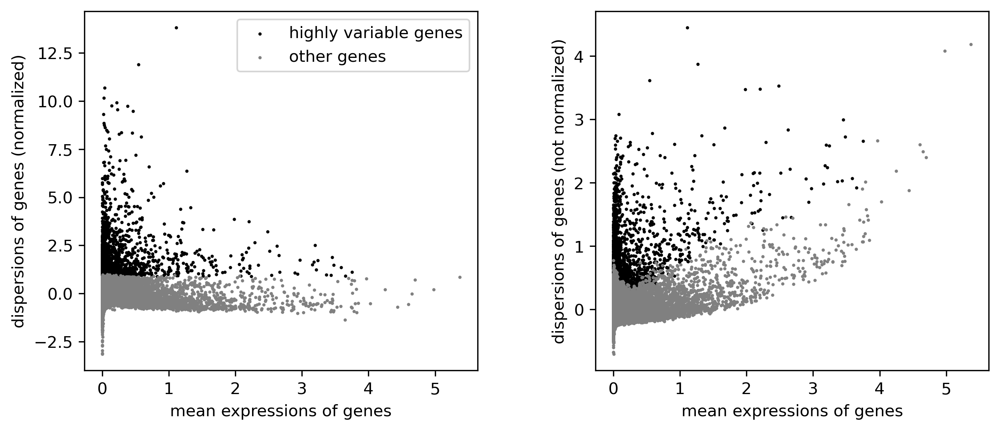

computing PCA
    with n_comps=50
    finished (0:00:02)


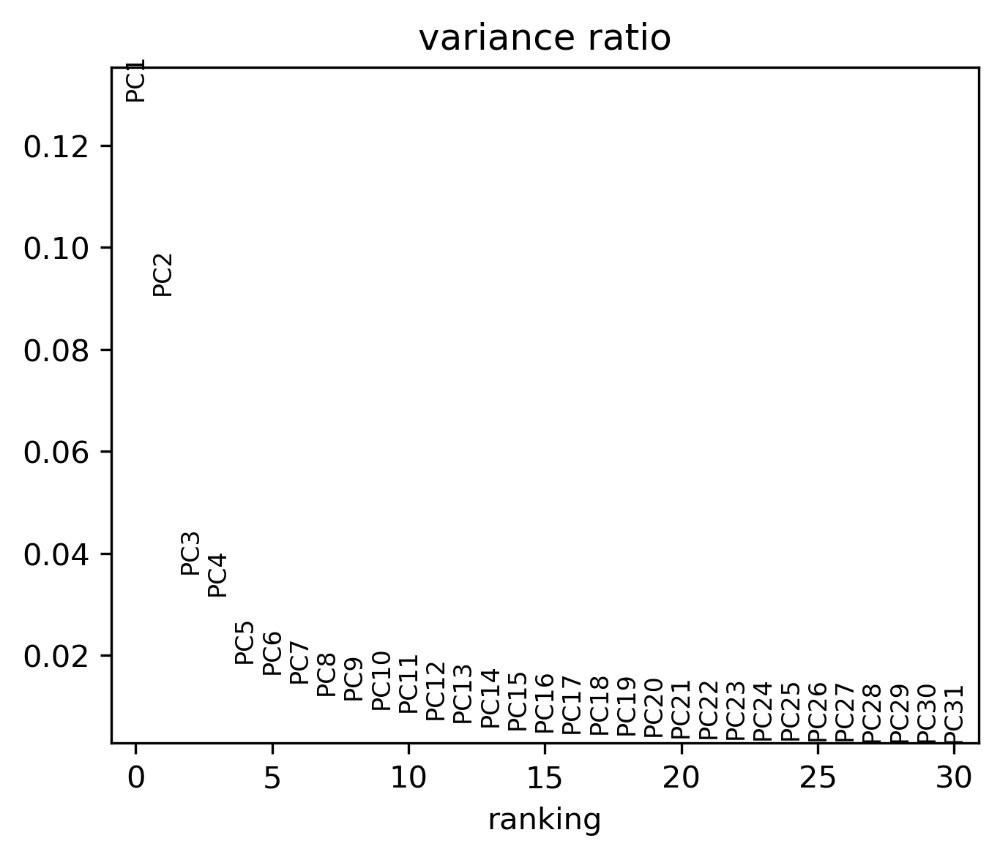

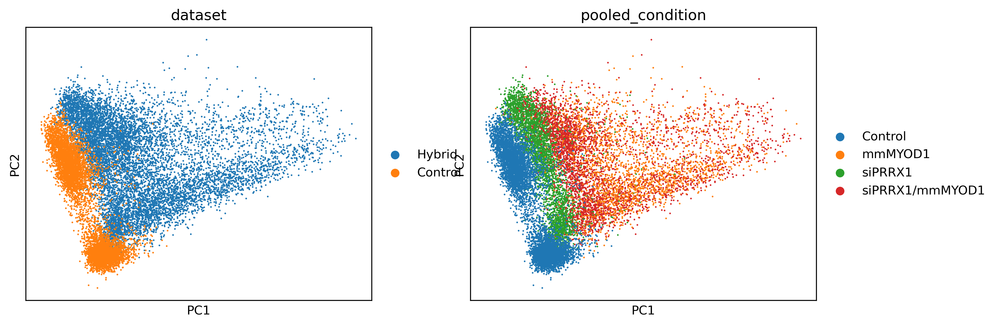

2025-06-02 13:11:59,078 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Mon Jun  2 13:11:59 2025 INFO Computing initial centroids with sklearn.KMeans...
2025-06-02 13:12:02,557 - harmonypy - INFO - sklearn.KMeans initialization complete.
Mon Jun  2 13:12:02 2025 INFO sklearn.KMeans initialization complete.
2025-06-02 13:12:02,646 - harmonypy - INFO - Iteration 1 of 10
Mon Jun  2 13:12:02 2025 INFO Iteration 1 of 10
2025-06-02 13:12:07,137 - harmonypy - INFO - Iteration 2 of 10
Mon Jun  2 13:12:07 2025 INFO Iteration 2 of 10
2025-06-02 13:12:11,804 - harmonypy - INFO - Converged after 2 iterations
Mon Jun  2 13:12:11 2025 INFO Converged after 2 iterations



Post-Harmony:


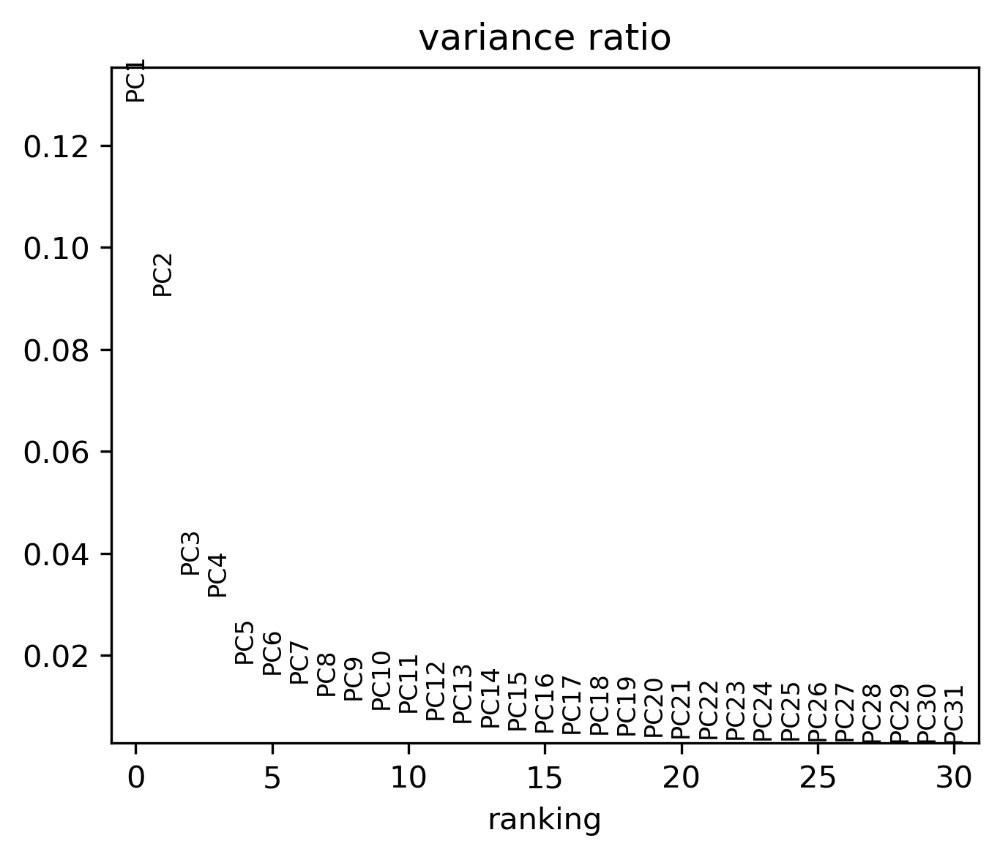

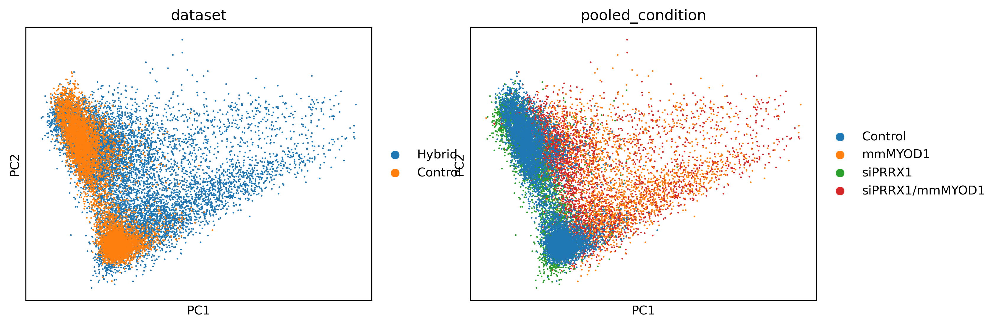

In [64]:
adata.layers['raw_counts'] = adata.X.copy()

# remove low count genes
sc.pp.filter_genes(adata, min_counts=10)

# Normalize counts
sc.pp.normalize_total(
    adata,
    target_sum=1e4,
)

adata.layers['norm_counts'] = adata.X.copy()

sc.pp.log1p(adata)
adata.layers['log_norm'] = adata.X.copy()


# HVGs
adata.X = adata.layers['log_norm']
sc.pp.highly_variable_genes(
    adata,
    batch_key='dataset',
    n_top_genes=2000, 
)

print(f"Number of HVG: {adata.var['highly_variable'].sum()}")

sc.pl.highly_variable_genes(adata)


# PCA
sc.pp.pca(adata)

sc.pl.pca_variance_ratio(adata)
sc.pl.pca(adata, color=['dataset', 'pooled_condition'])


# Harmony
sce.pp.harmony_integrate(adata, 'dataset')

# Save original PCA space and set Harmony-corrected PCA as the default
adata.obsm["X_pca_original"] = adata.obsm["X_pca"].copy()
adata.obsm["X_pca"] = adata.obsm["X_pca_harmony"].copy()

print("\nPost-Harmony:")
sc.pl.pca_variance_ratio(adata)
sc.pl.pca(adata, color=['dataset', 'pooled_condition'])

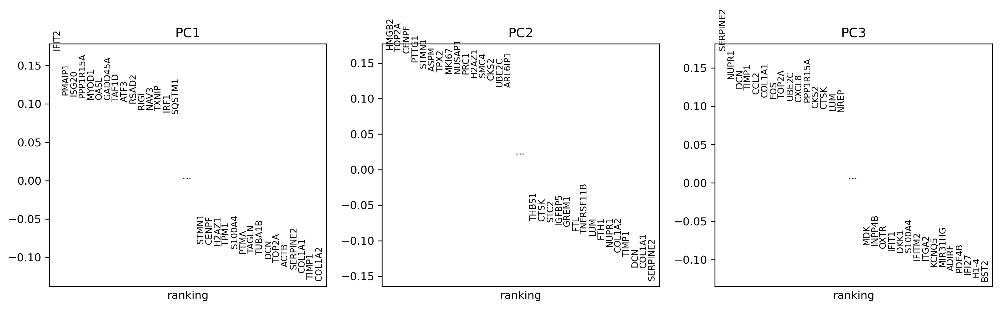

In [65]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

sc.pl.pca_loadings(adata)

(15833, 3)


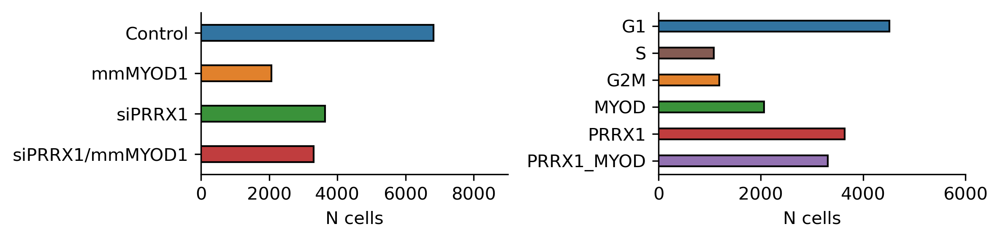

In [56]:
counts = pd.DataFrame({
    'cell_id': adata.obs.index,
    'pooled_condition': adata.obs['pooled_condition'].values,
    'assigned_condition': adata.obs['assigned_condition'].values,
})

print(counts.shape)

pool_df = counts.groupby('pooled_condition', observed=True).size().reset_index(name='cell_count')

barcode_df = counts.groupby('assigned_condition', observed=True).size().reset_index(name='cell_count')


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 2
fig, axs = plt.subplots(1, 2)

sns.barplot(data=pool_df, x='cell_count', y='pooled_condition', hue='pooled_condition', width=0.4, ec='k', ax=axs[0])
    
sns.barplot(data=barcode_df, x='cell_count', y='assigned_condition', hue='assigned_condition', width=0.4, ec='k', ax=axs[1],
           order=['G1', 'S', 'G2M', 'MYOD', 'PRRX1', 'PRRX1_MYOD'])
    
axs[0].set_ylabel("")
axs[1].set_ylabel("")
axs[0].set_xlabel("N cells")
axs[1].set_xlabel("N cells")

axs[0].set_xlim([0, 9000])
axs[1].set_xlim([0, 6000])

sns.despine()
plt.tight_layout()
plt.show()

running Leiden clustering
    finished (0:00:00)


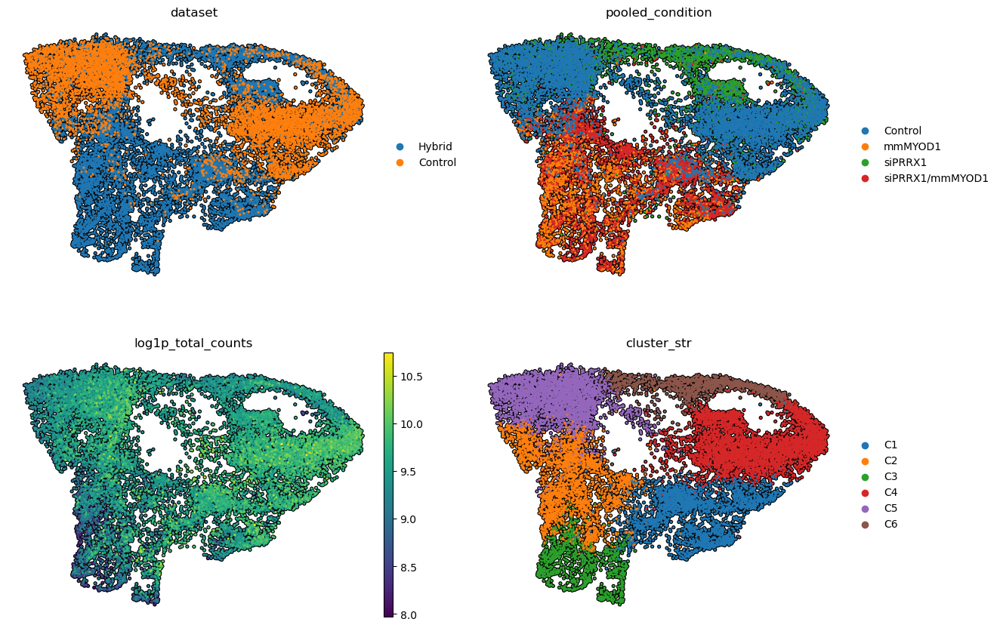

In [78]:
sc.pp.neighbors(
    adata,
    use_rep='X_pca_harmony',
    n_neighbors=10,
)

sc.tl.umap(
    adata,
    min_dist=0.2
)

sc.tl.leiden(
    adata,
    resolution=0.4,
    flavor="igraph",
    n_iterations=-1, 
    # restrict_to=('dataset', ['Control']),
)

adata.obs['cluster_str'] = adata.obs['leiden'].apply(lambda x: f"C{str(int(x) + 1)}")

plt.rcdefaults()

sc.pl.umap(
    adata,
    color=['dataset', 'pooled_condition', 'log1p_total_counts', 'cluster_str'],
    ncols=2,
    size=20,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

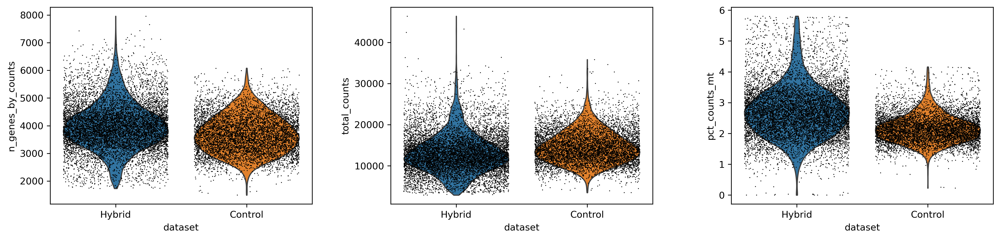

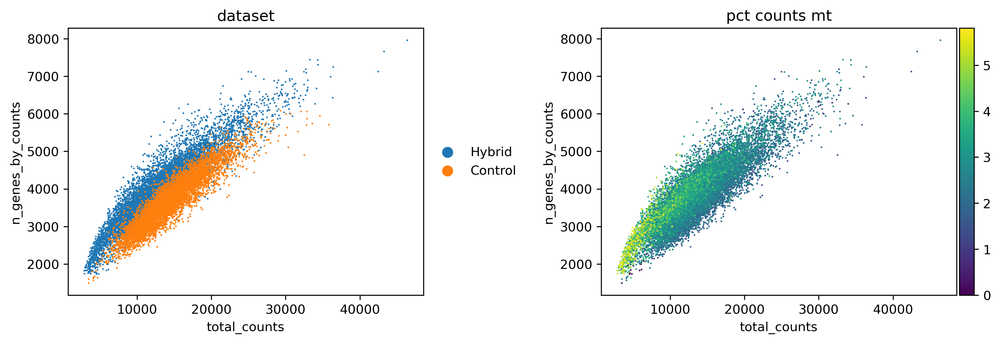

In [67]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
    groupby='dataset',
)

sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color=["dataset", "pct_counts_mt"])

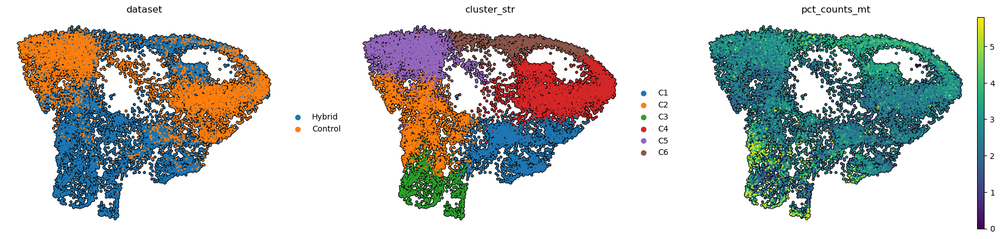

In [79]:
sc.pl.umap(
    adata,
    color=['dataset', 'cluster_str', 'pct_counts_mt'],
    ncols=3,
    size=20,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

(16367, 3)


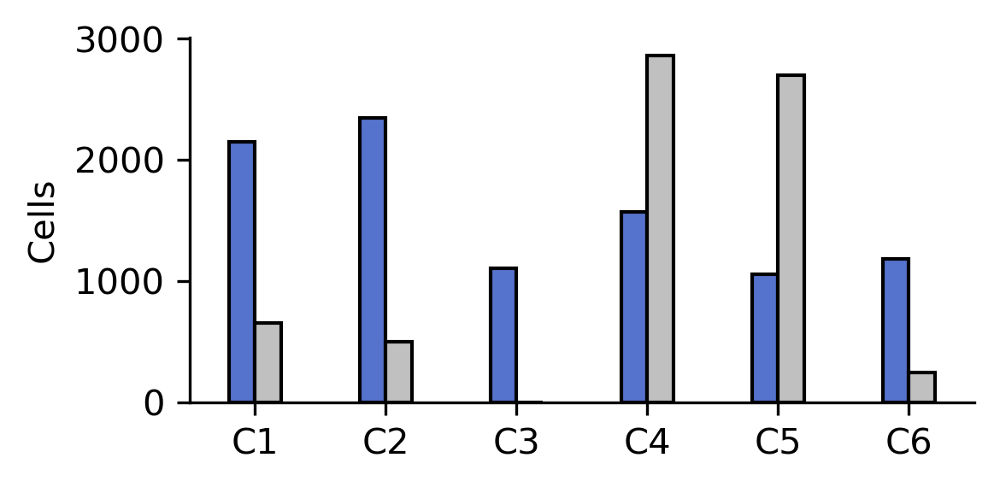

In [80]:
cluster_counts = pd.DataFrame({
    'cell_id': adata.obs.index,
    'cluster_str': adata.obs['cluster_str'].values,
    'dataset': adata.obs['dataset'].values,
})

print(cluster_counts.shape)
cluster_counts.head()

cluster_df = cluster_counts.groupby(['cluster_str', 'dataset'], observed=True).size().reset_index(name='cell_count')

plt.rcParams['figure.figsize'] = 4, 2
plt.rcParams['figure.dpi'] = 300

dataset_colors = ["royalblue", "silver"]

sns.barplot(
    data=cluster_df,
    x='cluster_str',
    y='cell_count',
    hue='dataset',
    width=0.4,
    ec='k',
    legend=False,
    palette=dataset_colors,
)

plt.xlabel("")
plt.ylabel("Cells")

sns.despine()
plt.tight_layout()
plt.show()

# Scanpy filtering (manual thresholding)

Filtering...

filtered out 626 cells that have less than 500 counts
filtered out 3359 genes that are detected in less than 10 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:03)
Number of HVG: 2000


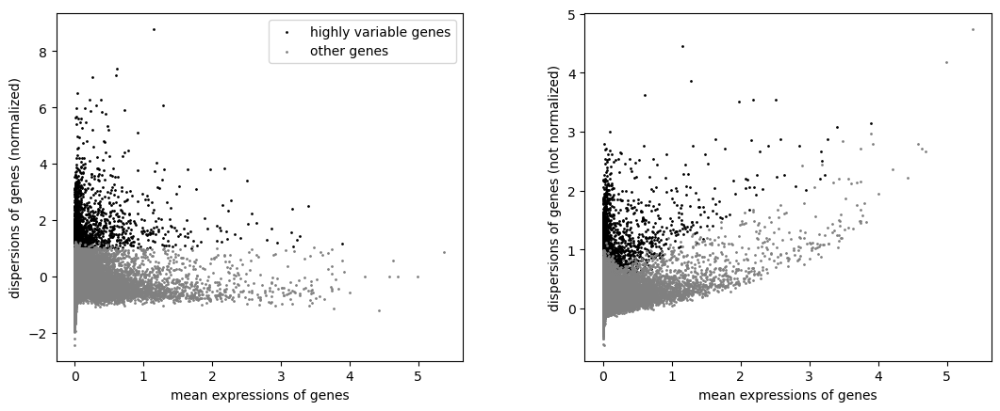

computing PCA
    with n_comps=50
    finished (0:00:02)


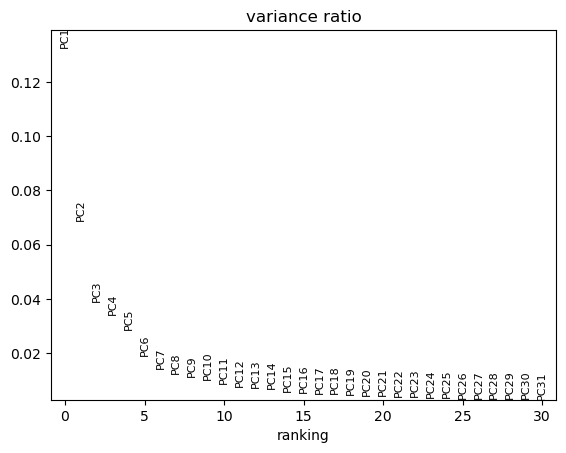

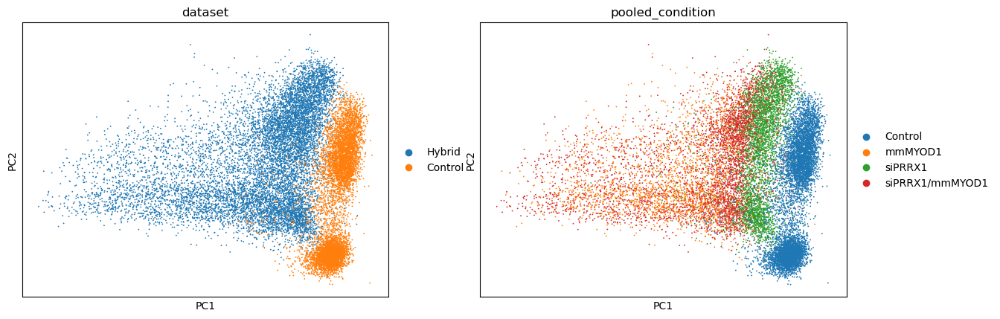

2025-06-02 11:02:15,346 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Mon Jun  2 11:02:15 2025 INFO Computing initial centroids with sklearn.KMeans...
2025-06-02 11:02:18,967 - harmonypy - INFO - sklearn.KMeans initialization complete.
Mon Jun  2 11:02:18 2025 INFO sklearn.KMeans initialization complete.
2025-06-02 11:02:19,059 - harmonypy - INFO - Iteration 1 of 10
Mon Jun  2 11:02:19 2025 INFO Iteration 1 of 10
2025-06-02 11:02:24,131 - harmonypy - INFO - Iteration 2 of 10
Mon Jun  2 11:02:24 2025 INFO Iteration 2 of 10
2025-06-02 11:02:29,073 - harmonypy - INFO - Converged after 2 iterations
Mon Jun  2 11:02:29 2025 INFO Converged after 2 iterations



Post-Harmony:


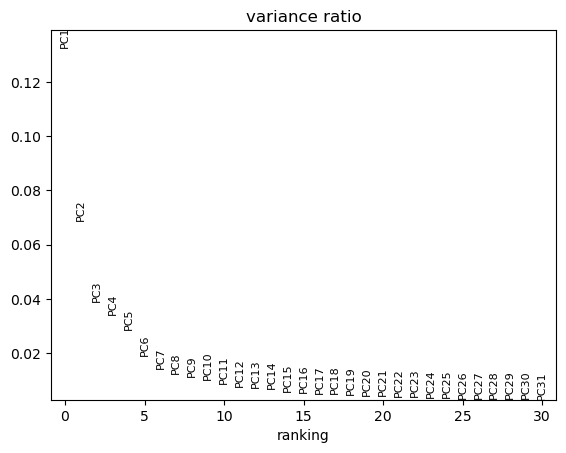

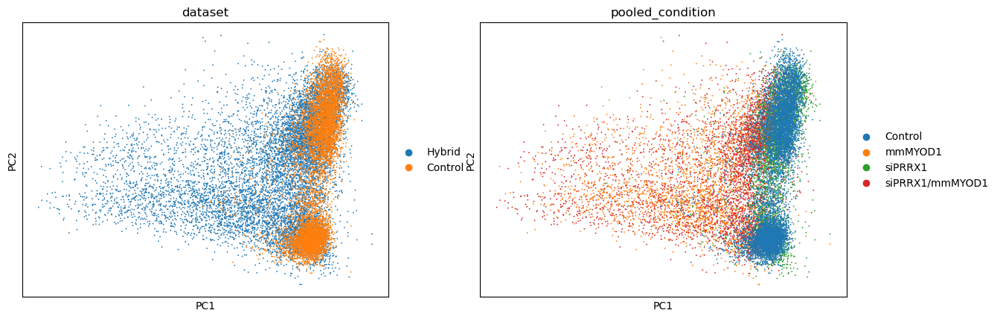

In [11]:
adata1 = adata_raw.copy()

adata1.layers['raw_counts'] = adata1.X.copy()

print("Filtering...\n")

adata1 = adata1[adata1.obs.pct_counts_mt < 20]
sc.pp.filter_cells(adata1, min_counts=500)
sc.pp.filter_genes(adata1, min_counts=10)

# sc.pp.filter_cells(adata, min_genes=500)
# sc.pp.filter_genes(adata, min_cells=10)

# Normalize counts
sc.pp.normalize_total(
    adata1,
    target_sum=1e4,
)

adata1.layers['norm_counts'] = adata1.X.copy()

sc.pp.log1p(adata1)
adata1.layers['log_norm'] = adata1.X.copy()


# HVGs
adata1.X = adata1.layers['log_norm']
sc.pp.highly_variable_genes(
    adata1,
    batch_key='dataset',
    n_top_genes=2000, 
)

print(f"Number of HVG: {adata1.var['highly_variable'].sum()}")

sc.pl.highly_variable_genes(adata1)


# PCA
sc.pp.pca(adata1)

sc.pl.pca_variance_ratio(adata1)
sc.pl.pca(adata1, color=['dataset', 'pooled_condition'])


# Harmony
sce.pp.harmony_integrate(adata1, 'dataset')

# Save original PCA space and set Harmony-corrected PCA as the default
adata1.obsm["X_pca_original"] = adata1.obsm["X_pca"].copy()
adata1.obsm["X_pca"] = adata1.obsm["X_pca_harmony"].copy()

print("\nPost-Harmony:")
sc.pl.pca_variance_ratio(adata1)
sc.pl.pca(adata1, color=['dataset', 'pooled_condition'])

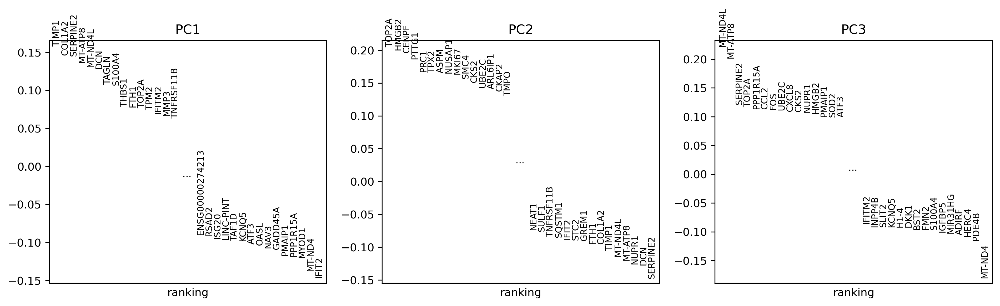

In [60]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

sc.pl.pca_loadings(adata1)

(17873, 3)


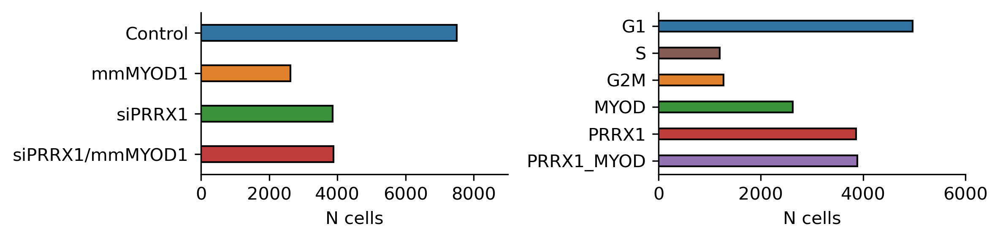

In [57]:
counts = pd.DataFrame({
    'cell_id': adata1.obs.index,
    'pooled_condition': adata1.obs['pooled_condition'].values,
    'assigned_condition': adata1.obs['assigned_condition'].values,
})

print(counts.shape)

pool_df = counts.groupby('pooled_condition', observed=True).size().reset_index(name='cell_count')

barcode_df = counts.groupby('assigned_condition', observed=True).size().reset_index(name='cell_count')


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 2
fig, axs = plt.subplots(1, 2)

sns.barplot(data=pool_df, x='cell_count', y='pooled_condition', hue='pooled_condition', width=0.4, ec='k', ax=axs[0])
    
sns.barplot(data=barcode_df, x='cell_count', y='assigned_condition', hue='assigned_condition', width=0.4, ec='k', ax=axs[1],
           order=['G1', 'S', 'G2M', 'MYOD', 'PRRX1', 'PRRX1_MYOD'])
    
axs[0].set_ylabel("")
axs[1].set_ylabel("")
axs[0].set_xlabel("N cells")
axs[1].set_xlabel("N cells")

axs[0].set_xlim([0, 9000])
axs[1].set_xlim([0, 6000])

sns.despine()
plt.tight_layout()
plt.show()

computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:13)
running Leiden clustering
    finished (0:00:00)


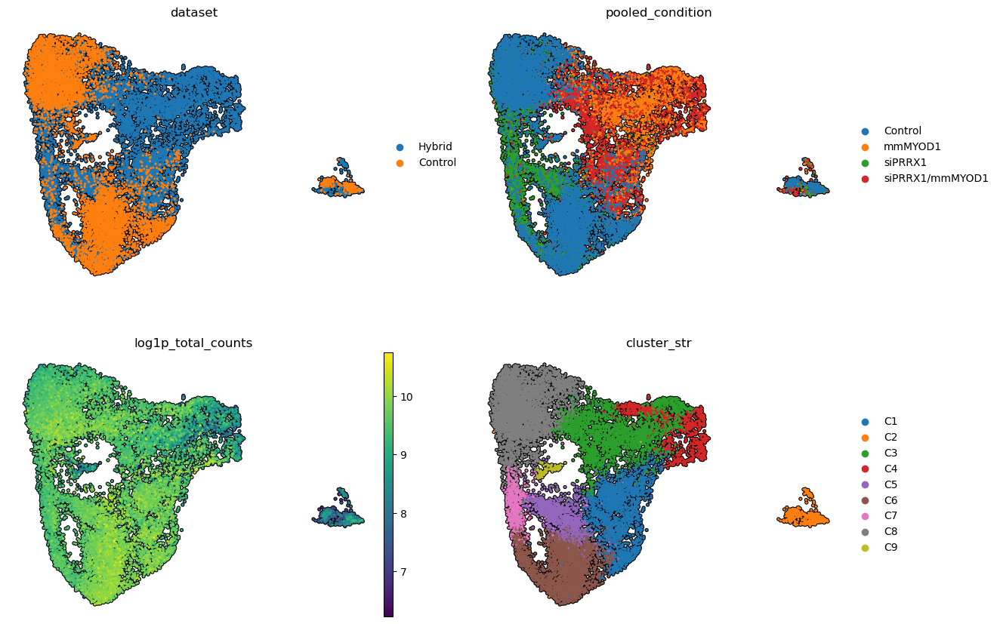

In [12]:
sc.pp.neighbors(
    adata1,
    use_rep='X_pca_harmony',
    n_neighbors=10,
)

sc.tl.umap(
    adata1,
    min_dist=0.25
)

sc.tl.leiden(
    adata1,
    resolution=0.5,
    flavor="igraph",
    n_iterations=-1, 
)

adata1.obs['cluster_str'] = adata1.obs['leiden'].apply(lambda x: f"C{str(int(x) + 1)}")

sc.pl.umap(
    adata1,
    color=['dataset', 'pooled_condition', 'log1p_total_counts', 'cluster_str'],
    ncols=2,
    size=20,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

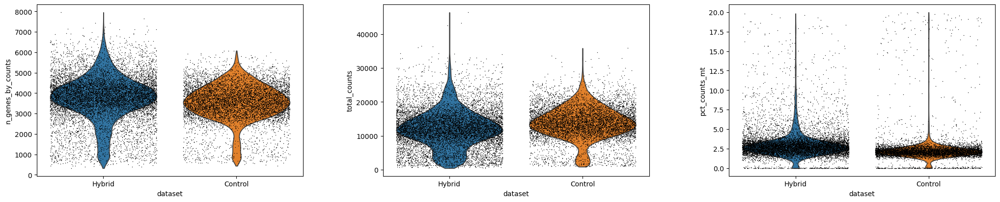

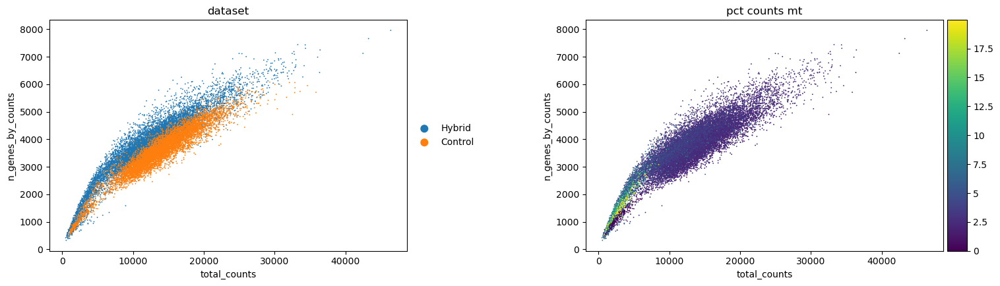

In [14]:
sc.pl.violin(
    adata1,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
    groupby='dataset',
)

sc.pl.scatter(adata1, "total_counts", "n_genes_by_counts", color=["dataset", "pct_counts_mt"])

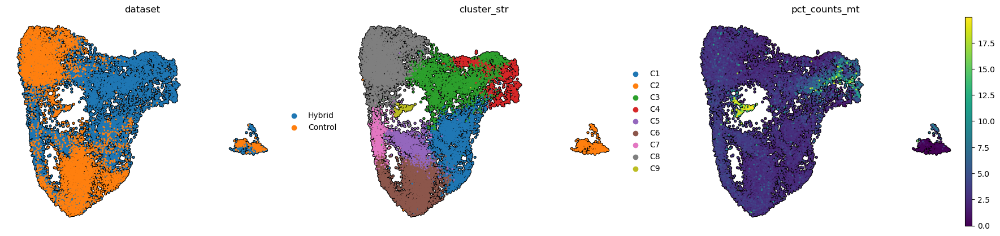

In [16]:
sc.pl.umap(
    adata1,
    color=['dataset', 'cluster_str', 'pct_counts_mt'],
    ncols=3,
    size=20,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)